In [47]:
import scanpy as sc
import numpy as np
import pandas as pd
import loompy
import matplotlib.pyplot as plt
import scipy.stats as st
import warnings
warnings.filterwarnings('ignore')

In [48]:
import sys
sys.path.insert(0,"/work/rwth1209/projects/integration_merfish_snrna/spage/SpaGE")

In [49]:
from SpaGE.main import SpaGE

In [50]:
scref = sc.read_h5ad('/work/rwth1209/dana_projects/test_new_imputation_tools/enVI/data_preprocessing/kidney/scref_3000hvg_raw_arr.h5ad')
sp = sc.read_h5ad('/work/rwth1209/dana_projects/test_new_imputation_tools/enVI/data_preprocessing/kidney/withhelded_kidney_array_raw_474_genes.h5ad')

In [51]:
scref

AnnData object with n_obs × n_vars = 51849 × 3228
    obs: 'nCount_RNA', 'nFeature_RNA', 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient.ID', 'Group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
    layers: 'counts', 'counts_norm'

In [52]:
sp

AnnData object with n_obs × n_vars = 401905 × 474
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'
    var: 'n_cells'
    uns: 'neighbors', 'pca', 'spatialdata_attrs', 'tacco_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'blank', 'spatial', 'tacco'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
spatial = sp
ref = scref

In [8]:
sp

AnnData object with n_obs × n_vars = 401905 × 474
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'
    var: 'n_cells'
    uns: 'neighbors', 'pca', 'spatialdata_attrs', 'tacco_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'blank', 'spatial', 'tacco'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [9]:
#spatial.X = spatial.layers["counts"].copy()
sc.pp.filter_cells(spatial, min_counts=5)
sc.pp.filter_genes(spatial, min_cells=5)
sc.pp.filter_cells(ref, min_counts=5)
sc.pp.filter_genes(ref, min_cells=5)
sc.pp.normalize_total(spatial, target_sum=1e4)
sc.pp.log1p(spatial)

In [10]:
# genes_to_imp = ['CCL21', 'MMRN1', 'PRF1', 'TBX1', 'PRF1',
#                 'NEXN', 'CACNA1D', 'PPP2R2B', 'BASP1', 'TM4SF1',
#                 'RNF19A', 'IMMP2L', 'NFKB1', 'CCDC141', 'SMC4']

In [11]:
spatial_genes = list(sp.var_names)
len(spatial_genes)
genes_to_keep = [gene for gene in ref.var_names if gene not in spatial_genes]


In [12]:
len(genes_to_keep)

2754

In [13]:
scref_filtered = ref[:, genes_to_keep]

In [14]:
ref

AnnData object with n_obs × n_vars = 51849 × 3228
    obs: 'nCount_RNA', 'nFeature_RNA', 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient.ID', 'Group', 'n_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells'
    uns: 'hvg'
    layers: 'counts', 'counts_norm'

In [15]:
scref_filtered

View of AnnData object with n_obs × n_vars = 51849 × 2754
    obs: 'nCount_RNA', 'nFeature_RNA', 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient.ID', 'Group', 'n_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells'
    uns: 'hvg'
    layers: 'counts', 'counts_norm'

In [16]:
genes_to_imp = list(scref_filtered.var_names)

In [17]:
len(genes_to_imp)

2754

In [18]:
ref = ref.to_df()
spatial = spatial.to_df()

In [19]:
Imp_New_Genes = SpaGE(spatial,ref,n_pv=30, genes_to_predict = genes_to_imp)

In [20]:
Imp_New_Genes.to_csv("result_allref_kidney.csv")

# Check results (csv -> h5ad)

In [41]:
import scanpy as sc
import scipy
import anndata as ad
import pandas as pd

In [42]:
tmp = pd.read_csv("/work/rwth1209/dana_projects/test_new_imputation_tools/SpaGE/kidney/result_allref_kidney.csv", index_col=0)
tmp = sc.AnnData(tmp)

In [44]:
original_withhelded = sc.read_h5ad('/work/rwth1209/dana_projects/test_new_imputation_tools/enVI/data_preprocessing/kidney/withhelded_kidney_array_raw_474_genes.h5ad')
tmp.X = scipy.sparse.csr_matrix(tmp.X)

In [ ]:
#sc.pp.filter_cells(spatial, min_counts=5)
#sc.pp.filter_genes(spatial, min_cells=5)

In [53]:
#original.X = original.layers["counts"].copy()
sc.pp.filter_cells(original_withhelded, min_counts=5)
sc.pp.filter_genes(original_withhelded, min_cells=5)
sc.pp.normalize_total(original_withhelded, target_sum=1e4)
sc.pp.log1p(original_withhelded)

In [56]:
tmp

AnnData object with n_obs × n_vars = 398999 × 2754

In [57]:
original_withhelded

AnnData object with n_obs × n_vars = 398999 × 474
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'
    var: 'n_cells'
    uns: 'neighbors', 'pca', 'spatialdata_attrs', 'tacco_colors', 'umap', 'log1p'
    obsm: 'X_pca', 'X_umap', 'blank', 'spatial', 'tacco'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [58]:
tmp.obs = original_withhelded.obs.copy()

In [59]:
tmp

AnnData object with n_obs × n_vars = 398999 × 2754
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'

In [60]:
original_withhelded

AnnData object with n_obs × n_vars = 398999 × 474
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'
    var: 'n_cells'
    uns: 'neighbors', 'pca', 'spatialdata_attrs', 'tacco_colors', 'umap', 'log1p'
    obsm: 'X_pca', 'X_umap', 'blank', 'spatial', 'tacco'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [63]:
#del original_withhelded.varm
#del original.layers

In [64]:
assert original_withhelded.obs_names.equals(tmp.obs_names)

original_withhelded
integrated = ad.concat([original_withhelded, tmp], label="batch",axis=1,join="outer",merge="first")
integrated

AnnData object with n_obs × n_vars = 398999 × 3228
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'
    var: 'n_cells', 'batch'
    obsm: 'X_pca', 'X_umap', 'blank', 'spatial', 'tacco'
    obsp: 'connectivities', 'distances'

In [65]:
integrated.write_h5ad("spage_3000_genes_kidney.h5ad")

In [66]:
spage = sc.read_h5ad('/work/rwth1209/dana_projects/test_new_imputation_tools/SpaGE/kidney/spage_3000_genes_kidney.h5ad')
original = sc.read_h5ad('/work/rwth1209/projects/Merfish_QC/500_kidney_26.2/preprocessed.h5ad')
scd = scref

In [67]:
spage

AnnData object with n_obs × n_vars = 398999 × 3228
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'
    var: 'n_cells', 'batch'
    obsm: 'X_pca', 'X_umap', 'blank', 'spatial', 'tacco'
    obsp: 'connectivities', 'distances'

In [68]:
#original.X = original.layers["counts"].copy()
original = original[spage.obs_names, :]
sc.pp.filter_cells(original, min_counts=5)
sc.pp.filter_genes(original, min_cells=5)
sc.pp.normalize_total(original, target_sum=1e4)
sc.pp.log1p(original)
original

AnnData object with n_obs × n_vars = 398999 × 500
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score'
    var: 'n_cells'
    uns: 'spatialdata_attrs', 'log1p'
    obsm: 'blank', 'spatial', 'tacco'

In [69]:
spage = spage[spage.obs_names, :]
sc.pp.filter_cells(spage, min_counts=5)
sc.pp.filter_genes(spage, min_cells=5)
sc.pp.normalize_total(spage, target_sum=1e4)
sc.pp.log1p(spage)
spage

AnnData object with n_obs × n_vars = 398999 × 3228
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score', 'n_genes'
    var: 'n_cells', 'batch'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap', 'blank', 'spatial', 'tacco'
    obsp: 'connectivities', 'distances'

In [70]:
original

AnnData object with n_obs × n_vars = 398999 × 500
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'COLIII_raw', 'COLIII_high_pass', 'VIM_raw', 'VIM_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Anti-Human_raw', 'Anti-Human_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'VCAM1_raw', 'VCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'region', 'slide', 'dataset_id', 'cells_region', 'EntityID', 'n_counts', 'tacco', 'tacco_score'
    var: 'n_cells'
    uns: 'spatialdata_attrs', 'log1p'
    obsm: 'blank', 'spatial', 'tacco'

In [71]:
original.obsm["spatial"]

array([[ 6996.28333308,   408.47066777],
       [ 7254.80809229,   414.48048824],
       [ 7214.70891074,   415.69810752],
       ...,
       [ 4342.3294093 , 11613.84630841],
       [ 4173.8438121 , 11629.87602957],
       [ 4160.36876889, 11662.26415222]])

In [72]:
spage.uns['spatial'] = original.obsm["spatial"]

In [73]:
original.X.max()

9.183044170284571

In [74]:
spage.X.max()

8.742968886379634

In [75]:
scd.X.max()

18182.0

In [77]:
genes_to_check = ['NPHS1','NPHS2','WT1','EMCN','PECAM1','COL1A1','COL3A1','AQP2','CFH','LRP2','CUBN','TACSTD2','SLC8A1','HSD11B2','CALB1',]

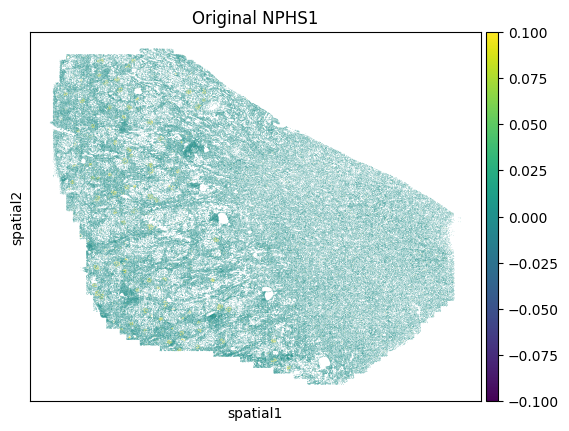

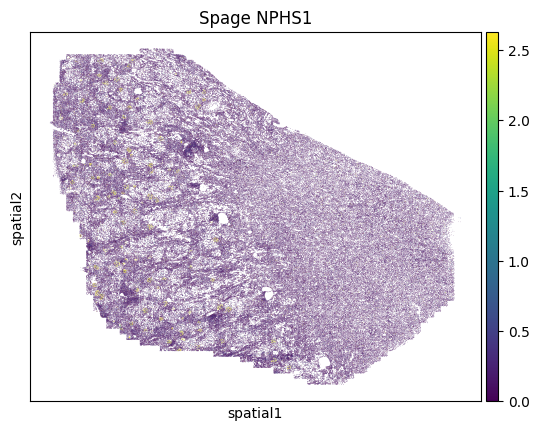

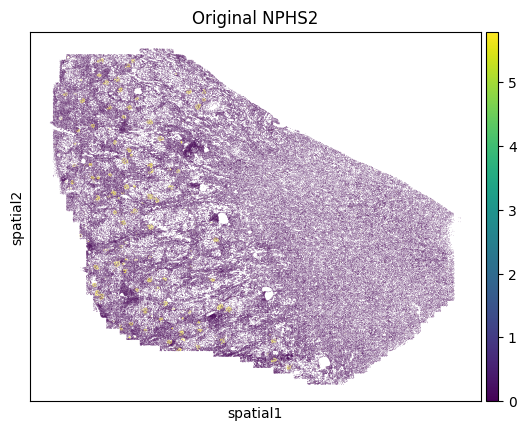

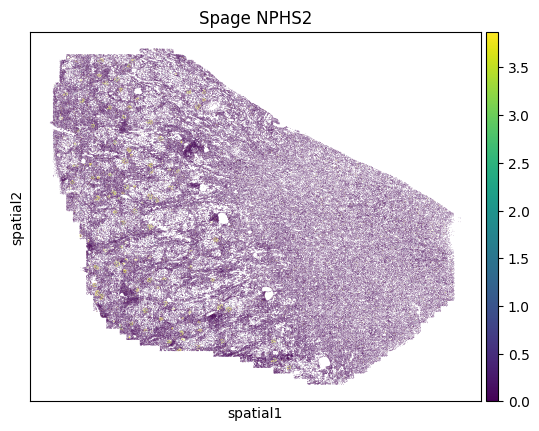

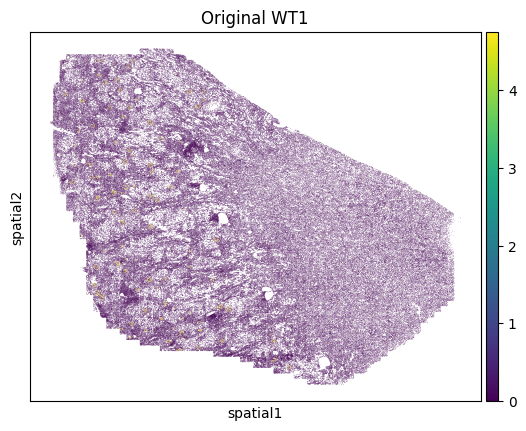

...

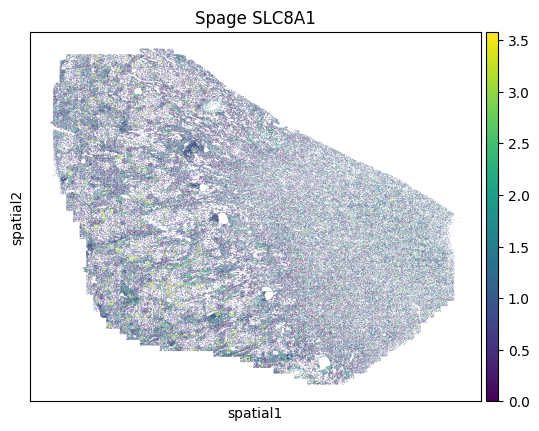

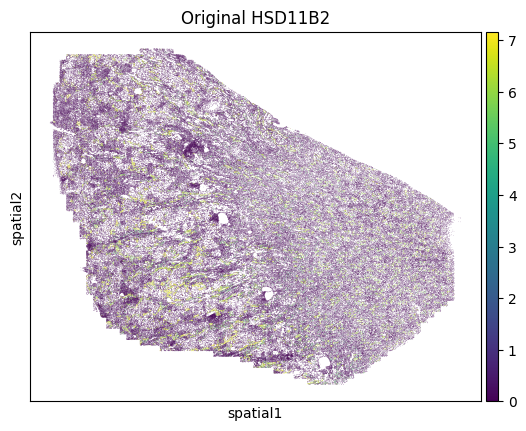

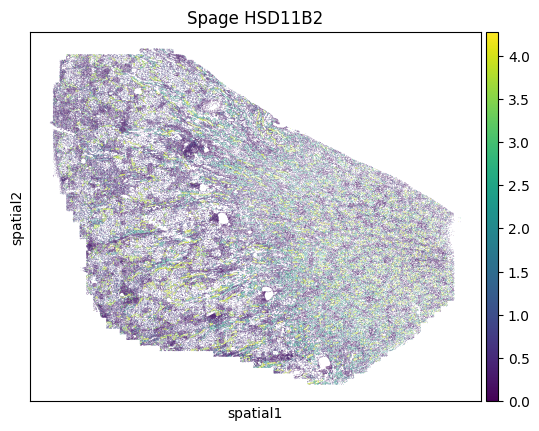

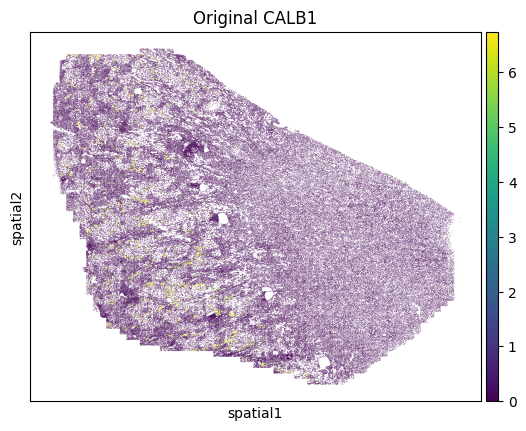

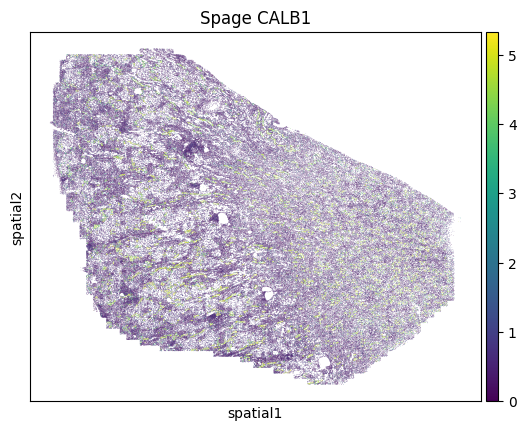

In [78]:
for gene in genes_to_check:
    sc.pl.embedding(original, basis="spatial", color=gene, title=f"Original {gene}",vmax="p99")
    sc.pl.embedding(spage, basis="spatial", color=gene, title=f"Spage {gene}",vmax="p99")

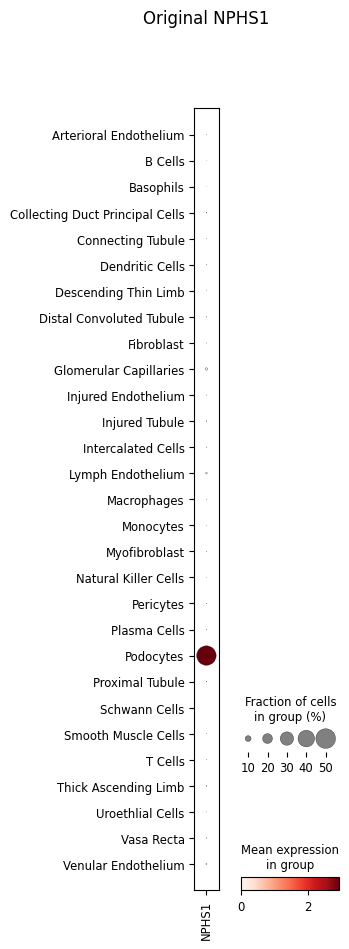

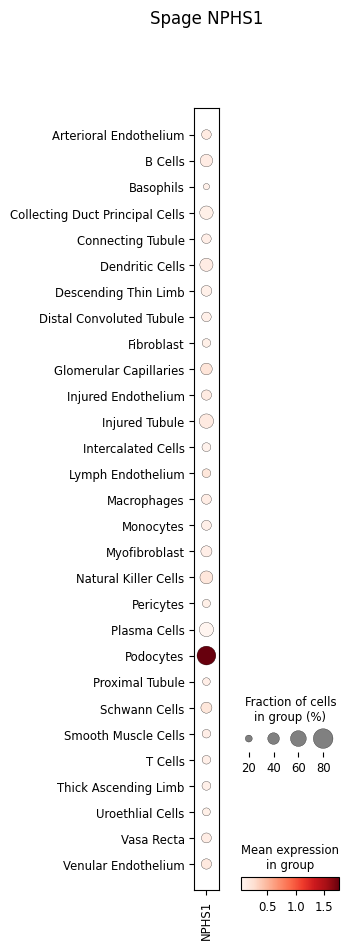

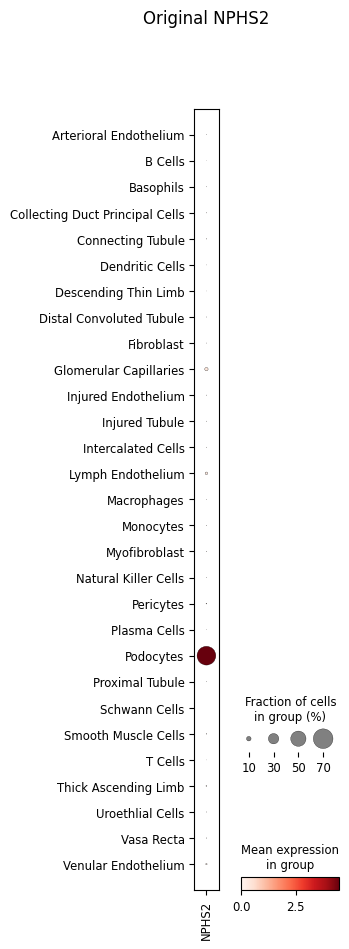

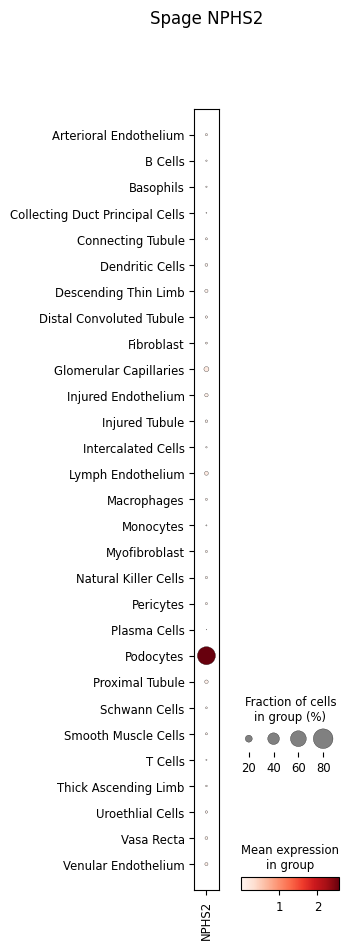

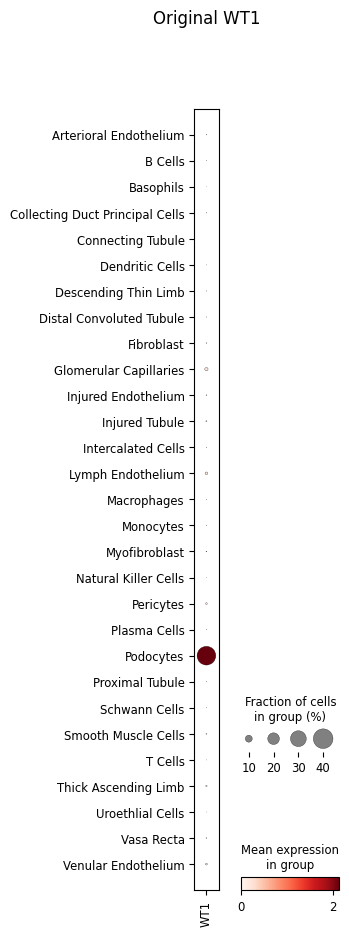

...

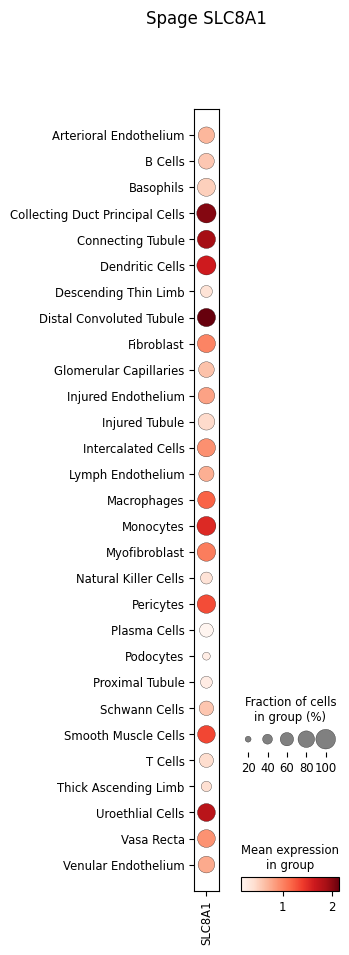

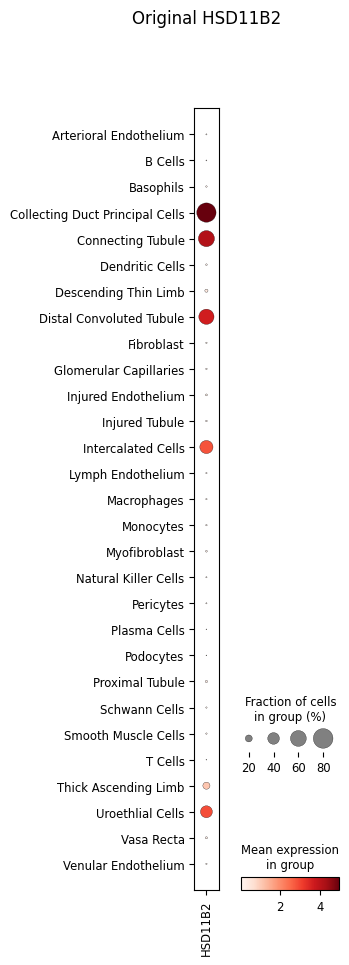

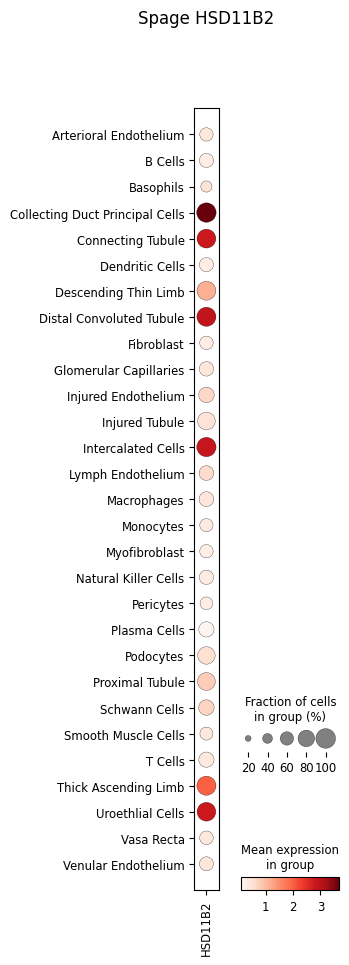

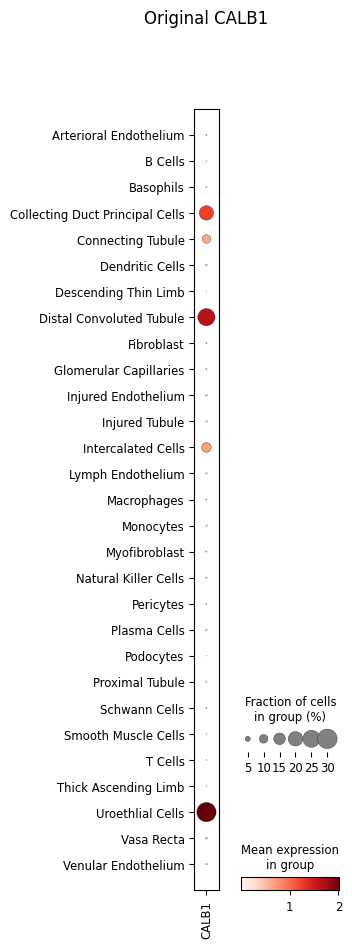

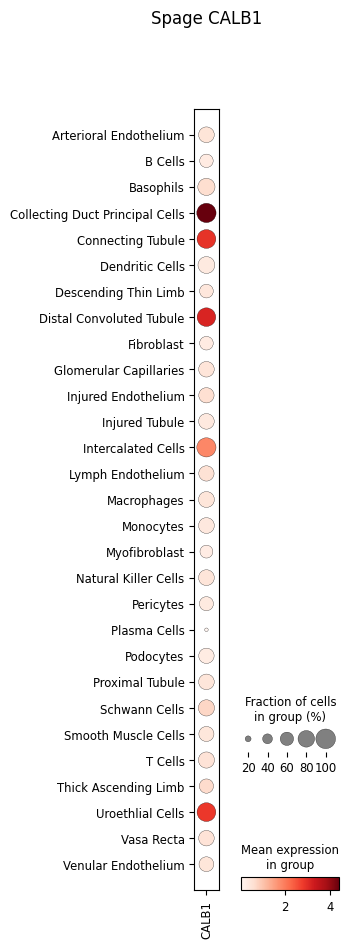

In [79]:
for gene in genes_to_check:
    sc.pl.dotplot(original, gene, groupby="tacco",title=f"Original {gene}")
    sc.pl.dotplot(spage, gene, groupby="tacco",title=f"Spage {gene}")

In [80]:
spage.write_h5ad("spage_3000_genes_norm_kidney.h5ad")

# Calculate Spearman correlation from two matrices

In [81]:
from scipy.stats import spearmanr
from sklearn.metrics import mean_squared_error

def spearman_correlation(a, b):
    a = a.toarray().flatten()
    b = b.toarray().flatten()
    print(a.shape, b.shape)
    print(mean_squared_error(a, b))
    return spearmanr(a, b)

In [82]:
for gene in genes_to_check:
    print(gene)
    print(spearman_correlation(original[:,gene].X, spage[:,gene].X))

NPHS1
(398999,) (398999,)
0.33102819605110173
SignificanceResult(statistic=0.10162193600003781, pvalue=0.0)
NPHS2
(398999,) (398999,)
0.4766615786760636
SignificanceResult(statistic=0.2879254597044376, pvalue=0.0)
WT1
(398999,) (398999,)
0.3897205592685012
SignificanceResult(statistic=0.13164967761347005, pvalue=0.0)
EMCN
(398999,) (398999,)
6.581992394295533
SignificanceResult(statistic=0.018790493209694253, pvalue=1.688958516722453e-32)
PECAM1
(398999,) (398999,)
4.767686019303751
SignificanceResult(statistic=0.3036753498626154, pvalue=0.0)
COL1A1
(398999,) (398999,)
2.050629674610142
SignificanceResult(statistic=0.1772325024740984, pvalue=0.0)
COL3A1
(398999,) (398999,)
3.0938845583492456
SignificanceResult(statistic=0.2078744644891186, pvalue=0.0)
AQP2
(398999,) (398999,)
1.5159432174283838
SignificanceResult(statistic=0.2570488491924081, pvalue=0.0)
CFH
(398999,) (398999,)
1.8762888724095188
SignificanceResult(statistic=0.11116854815406786, pvalue=0.0)
LRP2
(398999,) (398999,)
1.3

# UMAP

In [83]:
sp.var

,n_cells
PDK4,50072
UPP2,1052
SLC2A3,20947
IL4R,18270
CA12,7214
...,...
NRXN1,3808
PLCB1,4283
GRAMD1B,9458
CASR,3427


In [84]:
spage.var

,n_cells,batch
PDK4,50015,0
UPP2,1050,0
SLC2A3,20937,0
IL4R,18255,0
CA12,7201,0
...,...,...
RENBP,293316,1
PLXNA3,305637,1
FAM223A,63423,1
F8,337199,1


In [85]:
spatial_genes = list(sp.var_names)
len(spatial_genes)
genes_to_keep = [gene for gene in spage.var_names if gene not in spatial_genes]
spage_filtered = spage[:, genes_to_keep]

In [86]:
len(spatial_genes)

474

In [87]:
len(spage_filtered)

398999

In [88]:
spage.X.max()

8.742968886379634

In [89]:
sc.pp.neighbors(spage)

In [90]:
sc.tl.umap(spage)

In [91]:
# run as a job!!!
sc.tl.leiden(spage)

: 

In [ ]:
sc.tl.leiden(spage, key_added="leiden_res0_25", resolution=0.25)

In [ ]:
spage.write_h5ad("spage_3000_genes_norm.h5ad")

In [81]:
sc.tl.umap(original)

In [83]:
original

AnnData object with n_obs × n_vars = 180329 × 500
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_s

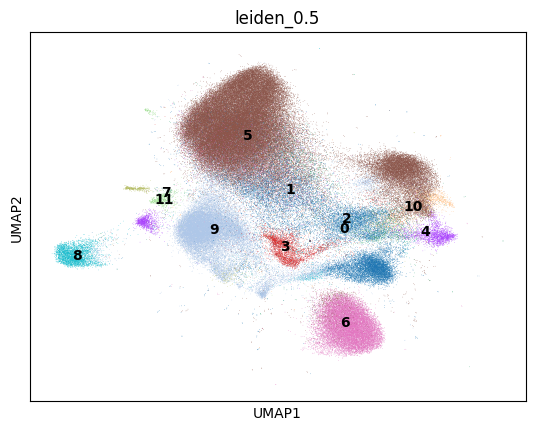

In [89]:
sc.pl.umap(
    original,
    color=["leiden_0.5"],
    legend_loc="on data")

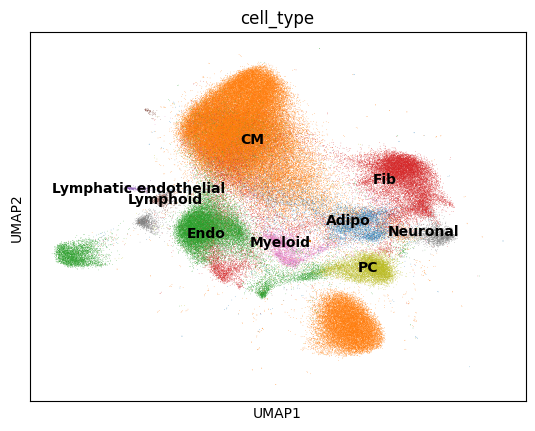

In [88]:
sc.pl.umap(
    original,
    color=["cell_type"],
    legend_loc="on data")